# <span style="color:#336699">Mineração de Dados Aplicada - Aprendizado Não Supervisionado</span>
<hr style="border:2px solid #0077b9;">

<br/>

<div style="text-align: center;font-size: 90%;">
    Professora:
    <br/>
    Vanessa Cristina Oliveira de Souza
    <br/> <br/>
    Autor:
    <br/>
    Ivan Leoni Vilas Boas 
    <br/> <br/>
    Agradecimento Especial:
    <br/>
    Flávio Belizário da Silva Mota 
    <br/><br/>
    ²Universidade Federal de Itajubá (UNIFEI)
    <br/><br/>
    Contato: <a href="mailto:Ivanleoni30@unifei.edu.br">ivanleoni30@unifei.edu.br</a>
    <br/>
    26/10/2022
    <br>
</div>

<br/>

<div style="text-align: justify;  margin-left: 25%; margin-right: 25%;">
<b>Objetivo.</b> Esse caderno Jupyter tem como objetivo apresentar métodos práticos de utilização de algoritmos de aprendizado não supervisionado Kmeans no projeto de Investimento
</div>

# Segmentação de Investimentos com Aprendizado Não Supervisionado
<hr style="border:2px solid #0077b9;">

A segmentação nada mais é do que a divisão dos investimentos em segmentos.

Esses grupos possuem características em comum, o que irá facilitar o trabalho de indicação de investimentos e facilitando o relacionamento com os clientes para diversificarem a carteria com tipos de produtos diferentes, mas que se relacinam entre si


## Cenário do negócio
<hr style="border:2px solid #0077b9;">

Suponha que estamos trabalhando como analistas de dados para uma empresa de <b>corretoras e investimentos</b> e queremos segmentar os investimentos oferecidos para ajudar os gerentes a indicarem novos produtos de investimentos com base nessa segmentação. Portanto, economizaremos  tempo e facilitaremos o trabalho do gerente de modo que ele possa realizar mais acertos de indicações aos clientes conforme um grupo específico de produtos de investimentos selecionados.

Nesse exemplo, todos os dados foram coletados através de varios sites declarados na documentação 01.

## Carregando bibliotecas
<hr style="border:2px solid #0077b9;">

In [1]:
import numpy as np
import pandas as pd

# Bibliotecas gráficas
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

## Carregando e entendendo os dados
<hr style="border:2px solid #0077b9;">

In [2]:
uri = 'C:\\Users\\IVAN LEONI\\Desktop\\notebooks\\dataFim.csv'
df = pd.read_csv(uri, index_col=0)
df.head()

,id,name,trade_market,market_type,type,benchmark,strategy,risk,liquidity,has_periodic_income,is_income_tax_free,fees,market,investor,return,volatility,sharpe,max_dd,var,minimum_application
0,RRRP3,3R PETROLEUM ÓLEO E GÁS S.A,NOVO MERCADO,Ações,NaN,IBOV,Renda Variável,4.0,2,True,False,brokerage,Renda Variável,Público Geral,-0.012772,0.546089,-0.203219,-0.419996,0.075613,33.37
1,AERI3,AERIS IND. E COM. DE EQUIP. GERACAO DE ENERGIA...,NOVO MERCADO,Ações,NaN,IBOV,Renda Variável,4.0,2,True,False,brokerage,Renda Variável,Público Geral,-0.601458,0.654105,-1.069647,-0.758763,0.088618,2.80
2,AESB3,AES BRASIL ENERGIA S.A.,NOVO MERCADO,Ações,NaN,IBOV,Renda Variável,4.0,2,True,False,brokerage,Renda Variável,Público Geral,-0.228653,0.292589,-1.117116,-0.368523,0.038853,10.20
3,AFLT3,AFLUENTE TRANSMISSÃO DE ENERGIA ELÉTRICA S/A,BOLSA,Ações,NaN,IBOV,Renda Variável,4.0,2,True,False,brokerage,Renda Variável,Público Geral,0.066005,0.388282,-0.082924,-0.148004,0.056708,9.21
4,AGXY3,AGROGALAXY PARTICIPAÇÕES S.A.,NOVO MERCADO,Ações,NaN,IBOV,Renda Variável,4.0,2,True,False,brokerage,Renda Variável,Público Geral,0.003454,0.614427,-0.154208,-0.445000,0.075715,8.75


### Limpeza dos dados 
<hr style="border:2px solid #0077b9;">

In [3]:
df.count()

id                     18431
name                   18431
trade_market           18431
market_type            18042
type                     389
benchmark              18042
strategy               18042
risk                   18042
liquidity              18431
has_periodic_income    18431
is_income_tax_free     18431
fees                    5891
market                 18431
investor               18431
return                 18422
volatility             18421
sharpe                 18421
max_dd                 18431
var                    18431
minimum_application    18431
dtype: int64

O atributo type apresenta 97% campos nulos e o restante é uma variavel constante de valor "BDR" e o atributo fees apresenta 68% de campos nulos, assim devido a variadade de atributos relevantes com dados completos completos e a grande quantidade de dados faltantes, optou-se por Remover da base de dados para se aproximar mais da realidade ao inves de completar os dados faltantes. O atributo nome sera removido pois não será relevante para a análiese e para a identificação será utilizado o id.

In [4]:
#del df['type','fees']
df.drop(columns=['name','type', 'fees'], axis = 1, inplace = True)

Uma informação importante que obtivemos a partir da exploração dos dados é que existiam valores repetidos do atributo ID. Vamos investigar esse atributo. Primeiramente, podemos verificar quantos são os valores únicos presentes nessa coluna:

In [5]:
df['id'].nunique()  # Verifica valores únicos na coluna

7106

 o valor acima indica que, dos 18431 registros resultantes 7106 possuem valor de ID único e 11.325 são aparentemene repetidos. Sabemos então que pode haver repetição de IDs. No entanto, em que quantidade? Um único ID está sendo replicado várias vezes?

Para responder essas perguntas, vamos utilizar o método value_counts():

In [6]:
contagem_id = df['id'].value_counts() # Conta as ocorrências dos valores de uma coluna
contagem_id.head(10) # Exibe os 5 primeiros registros

IPCA-1.0-0.09    586
PRÉ-1.0-0.15     563
CDI-1.15-0.0     277
CDI-1.0-0.0      236
CDI-1.09-0.0     214
CDI-1.06-0.0     205
CDI-1.04-0.0     191
CDI-1.12-0.0     184
CDI-1.02-0.0     160
CDI-1.08-0.0     153
Name: id, dtype: int64

Assim, temos uma variável contagem_id que armazena o número de vezes que um ID apareceu no conjunto. Podemos repetir a operação, agora considerando essa variável, para obter a contagem dessas repetições:

In [7]:
contagem_id.value_counts() 

1      6113
2       250
3       129
4       127
5        73
       ... 
26        1
69        1
74        1
50        1
586       1
Name: id, Length: 80, dtype: int64

Com a saída anterior, podemos ver que 6113 registros ocorrem uma vez e varios IDs ocorrem mais de uma vez. Sendo assim, podemos criar uma máscara booleana para acessar os índices dos registros que possuem contagem maior que 1

In [8]:
mascara_id_repetidos = contagem_id > 1 #Cria uma máscara lógica onde o valor de ocorrências for maior que 1
mascara_id_repetidos[0:10]

IPCA-1.0-0.09    True
PRÉ-1.0-0.15     True
CDI-1.15-0.0     True
CDI-1.0-0.0      True
CDI-1.09-0.0     True
CDI-1.06-0.0     True
CDI-1.04-0.0     True
CDI-1.12-0.0     True
CDI-1.02-0.0     True
CDI-1.08-0.0     True
Name: id, dtype: bool

Com a máscara criada, podemos selecionar os IDs que estão repetidos, para que possamos analisar esses registros:

In [9]:
ids_repetidos  = contagem_id.index[mascara_id_repetidos] # Retorna os IDs dos registros que estão na máscara
ids_repetidos  = list(ids_repetidos) # Converte para uma lista
len(ids_repetidos) # Verifica o tamanho da lista

993

A lista de IDs repetidos uma ou mais vezes é de 993, uma vez que, 6.113 + 993 = 7106 registros unicos. Vamos utilizar agora essa lista para examinar os registros que possuem IDs repetidos

Utilizando apenas o primeiro ID da lista de repetidos, primeiro queremos encontrar as linhas que contêm esses IDs. Para isso, usamos o método isin(), que cria uma outra máscara lógica que pode ser usada no DataFrame para de fato exibir os registros que queremos, através do método .loc. Por fim, pedimos para ver as primeiras linhas do resultado dessa consulta:

In [10]:
df.loc[df['id'].isin(ids_repetidos[0:1]), :].head(10)

,id,trade_market,market_type,benchmark,strategy,risk,liquidity,has_periodic_income,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application
6197,IPCA-1.0-0.09,INVESTMENT BROKER,CDB,IPCA,Inflação,2.5,235,False,False,Renda Fixa,Público Geral,0.152537,0.003399,15.984629,0.0,-0.000108,1013.749729
6198,IPCA-1.0-0.09,INVESTMENT BROKER,CDB,IPCA,Inflação,2.5,252,False,False,Renda Fixa,Público Geral,0.152537,0.003399,15.984629,0.0,-0.000108,1004.060983
6199,IPCA-1.0-0.09,INVESTMENT BROKER,CDB,IPCA,Inflação,2.5,458,False,False,Renda Fixa,Público Geral,0.152537,0.003399,15.984629,0.0,-0.000108,1068.213170
6200,IPCA-1.0-0.09,INVESTMENT BROKER,CDB,IPCA,Inflação,2.5,686,False,False,Renda Fixa,Público Geral,0.152537,0.003399,15.984629,0.0,-0.000108,1106.657242
6201,IPCA-1.0-0.09,INVESTMENT BROKER,CDB,IPCA,Inflação,2.5,668,False,False,Renda Fixa,Público Geral,0.152537,0.003399,15.984629,0.0,-0.000108,1.324155
6202,IPCA-1.0-0.09,INVESTMENT BROKER,CDB,IPCA,Inflação,2.5,598,False,False,Renda Fixa,Público Geral,0.152537,0.003399,15.984629,0.0,-0.000108,1227.174996
6203,IPCA-1.0-0.09,INVESTMENT BROKER,CDB,IPCA,Inflação,2.5,203,False,False,Renda Fixa,Público Geral,0.152537,0.003399,15.984629,0.0,-0.000108,1.166347
6204,IPCA-1.0-0.09,INVESTMENT BROKER,CDB,IPCA,Inflação,2.5,587,False,False,Renda Fixa,Público Geral,0.152537,0.003399,15.984629,0.0,-0.000108,1.112900
6205,IPCA-1.0-0.09,INVESTMENT BROKER,CDB,IPCA,Inflação,2.5,371,False,False,Renda Fixa,Público Geral,0.152537,0.003399,15.984629,0.0,-0.000108,1100.166619
6206,IPCA-1.0-0.09,INVESTMENT BROKER,CDB,IPCA,Inflação,2.5,654,False,False,Renda Fixa,Público Geral,0.152537,0.003399,15.984629,0.0,-0.000108,1097.639550


Quase todos os demais atributos estão iguais, inclusive e obviamente o id, principlamente para os de renda fixa. No entato o atributo liquidez que indica o numero de dias e o atributo minimum_application que representa o valor minimo de cada investimento são diferentes, resultando em registros portanto diferentes, sendo a liquidez e o valor minimo atributos diferenciais importantes no contesto de análise de investimento, assim sendo os ids seram renomeados para melhor identicaçaõ da repetição:

In [11]:
df["id"] =df.agg(lambda x: f"{x['id']}-{x['liquidity']}-{x['minimum_application']}", axis=1)


Repetindo o processo para verificar se ha repetição dos dados

In [12]:
df['id'].nunique()  # Verifica valores únicos na coluna

14342

o valor acima indica que, dos 18431 registros resultantes 14342 possuem valor de ID único e 4.089 são aparentemene repetidos. Sabemos então que pode haver repetição de IDs. No entanto, em que quantidade? Um único ID está sendo replicado várias vezes?

Para responder essas perguntas, vamos utilizar o método value_counts():

In [13]:
contagem_id = df['id'].value_counts() # Conta as ocorrências dos valores de uma coluna
contagem_id.head(10) # Exibe os 5 primeiros registros

CDI-1.06-0.0-365-10000.0    59
CDI-1.0-0.0-60-10000.0      38
CDI-1.02-0.0-90-10000.0     28
CDI-1.05-0.0-365-10000.0    27
CDI-1.0-0.0-181-10000.0     27
CDI-1.01-0.0-90-10000.0     27
CDI-1.02-0.0-120-10000.0    25
CDI-1.04-0.0-182-10000.0    25
CDI-1.07-0.0-365-10000.0    25
CDI-1.05-0.0-721-10000.0    23
Name: id, dtype: int64

Assim, temos nobvamente a variável contagem_id que armazena o número de vezes que um ID apareceu no conjunto. Podemos repetir a operação, agora considerando essa variável, para obter a contagem dessas repetições:

In [14]:
contagem_id.value_counts() 

1     12492
2      1300
3       219
4       111
5        59
6        24
7        22
13       18
9        15
10       12
12       12
8        10
11        7
14        7
20        5
15        3
17        3
18        3
21        3
22        3
25        3
27        3
16        2
23        2
38        1
19        1
28        1
59        1
Name: id, dtype: int64

Com a saída anterior, podemos ver que 12492 registros ocorrem uma vez e varios IDs ocorrem mais de uma vez. Sendo assim, podemos criar uma máscara booleana para acessar os índices dos registros que possuem contagem maior que 1

In [15]:
mascara_id_repetidos = contagem_id > 1# Cria uma máscara lógica onde o valor de ocorrências for maior que 1
mascara_id_repetidos[0:20]

CDI-1.06-0.0-365-10000.0    True
CDI-1.0-0.0-60-10000.0      True
CDI-1.02-0.0-90-10000.0     True
CDI-1.05-0.0-365-10000.0    True
CDI-1.0-0.0-181-10000.0     True
CDI-1.01-0.0-90-10000.0     True
CDI-1.02-0.0-120-10000.0    True
CDI-1.04-0.0-182-10000.0    True
CDI-1.07-0.0-365-10000.0    True
CDI-1.05-0.0-721-10000.0    True
CDI-1.04-0.0-365-10000.0    True
CDI-0.92-0.0-365-10000.0    True
CDI-1.11-0.0-721-10000.0    True
CDI-0.9-0.0-180-10000.0     True
CDI-0.92-0.0-360-10000.0    True
CDI-1.1-0.0-730-10000.0     True
CDI-1.04-0.0-721-10000.0    True
CDI-0.97-0.0-547-10000.0    True
CDI-0.96-0.0-365-10000.0    True
CDI-0.9-0.0-273-10000.0     True
Name: id, dtype: bool

In [16]:
ids_repetidos  = contagem_id.index[mascara_id_repetidos] # Retorna os IDs dos registros que estão na máscara
ids_repetidos  = list(ids_repetidos) # Converte para uma lista
len(ids_repetidos) # Verifica o tamanho da lista

1850

A lista de IDs repetidos uma ou mais vezes é de 1850, uma vez que, 12.492 + 1.850 = 14.342 registros unicos. Vamos utilizar agora essa lista para examinar os registros que possuem IDs repetidos

Utilizando apenas o primeiro ID da lista de repetidos, primeiro queremos encontrar as linhas que contêm esses IDs. Para isso, usamos o método isin(), que cria uma outra máscara lógica que pode ser usada no DataFrame para de fato exibir os registros que queremos, através do método .loc. Por fim, pedimos para ver as primeiras linhas do resultado dessa consulta:

In [17]:
df.loc[df['id'].isin(ids_repetidos[0:1]), :].head(10)

,id,trade_market,market_type,benchmark,strategy,risk,liquidity,has_periodic_income,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application
11719,CDI-1.06-0.0-365-10000.0,INVESTMENT BROKER,CDB,CDI,Pós-Fixado,2.5,365,False,False,Renda Fixa,Qualificado,0.104392,0.001731,3.575706,0.0,-0.000203,10000.0
11720,CDI-1.06-0.0-365-10000.0,INVESTMENT BROKER,CDB,CDI,Pós-Fixado,2.5,365,False,False,Renda Fixa,Qualificado,0.104392,0.001731,3.575706,0.0,-0.000203,10000.0
11721,CDI-1.06-0.0-365-10000.0,INVESTMENT BROKER,CDB,CDI,Pós-Fixado,2.5,365,False,False,Renda Fixa,Qualificado,0.104392,0.001731,3.575706,0.0,-0.000203,10000.0
11726,CDI-1.06-0.0-365-10000.0,INVESTMENT BROKER,CDB,CDI,Pós-Fixado,2.5,365,False,False,Renda Fixa,Qualificado,0.104392,0.001731,3.575706,0.0,-0.000203,10000.0
11727,CDI-1.06-0.0-365-10000.0,INVESTMENT BROKER,CDB,CDI,Pós-Fixado,2.5,365,False,False,Renda Fixa,Qualificado,0.104392,0.001731,3.575706,0.0,-0.000203,10000.0
11729,CDI-1.06-0.0-365-10000.0,INVESTMENT BROKER,CDB,CDI,Pós-Fixado,2.5,365,False,False,Renda Fixa,Qualificado,0.104392,0.001731,3.575706,0.0,-0.000203,10000.0
11732,CDI-1.06-0.0-365-10000.0,INVESTMENT BROKER,CDB,CDI,Pós-Fixado,2.5,365,False,False,Renda Fixa,Qualificado,0.104392,0.001731,3.575706,0.0,-0.000203,10000.0
11733,CDI-1.06-0.0-365-10000.0,INVESTMENT BROKER,CDB,CDI,Pós-Fixado,2.5,365,False,False,Renda Fixa,Qualificado,0.104392,0.001731,3.575706,0.0,-0.000203,10000.0
11735,CDI-1.06-0.0-365-10000.0,INVESTMENT BROKER,CDB,CDI,Pós-Fixado,2.5,365,False,False,Renda Fixa,Qualificado,0.104392,0.001731,3.575706,0.0,-0.000203,10000.0
11738,CDI-1.06-0.0-365-10000.0,INVESTMENT BROKER,CDB,CDI,Pós-Fixado,2.5,365,False,False,Renda Fixa,Qualificado,0.104392,0.001731,3.575706,0.0,-0.000203,10000.0


como pode ser obervado existe registros repetidos. Então a seguir serão excluidos os registros repetidos, mantendo apenas o ultimo atraves da função drop_duplicates que ira manter o ultimo registro no banco atraves do argumento keep='last'. O motivo da duplicata esta pelo fato do apprendafixa gerar investimentos com os mesmos atributos, porém que provem de instituições diferentes, no entando o banco emissor não é uma variavel importante e determinante na nossa análise de investimento, focaremos apenas nos atributos a cerca do investimento em si.

In [18]:
df = df.drop_duplicates(subset=['id'],keep="last")

In [19]:
df['id'].nunique()

14342

Assim sendo o temos então um <b> total de  14.342 regitros </b> para nosssa analise, vamos agora analisar a qualidade dos dados dos demias atributos:

In [20]:
df.count()

id                     14342
trade_market           14342
market_type            13953
benchmark              13953
strategy               13953
risk                   13953
liquidity              14342
has_periodic_income    14342
is_income_tax_free     14342
market                 14342
investor               14342
return                 14334
volatility             14333
sharpe                 14333
max_dd                 14342
var                    14342
minimum_application    14342
dtype: int64

percebemos que ha discrepancias nos atributos, então a seguir serão analisados e tratados os dados nulos  destes atributos. vamos ver quantos atributos com valores nulos existem a seguir:

In [21]:
print(df.isnull().sum())

id                       0
trade_market             0
market_type            389
benchmark              389
strategy               389
risk                   389
liquidity                0
has_periodic_income      0
is_income_tax_free       0
market                   0
investor                 0
return                   8
volatility               9
sharpe                   9
max_dd                   0
var                      0
minimum_application      0
dtype: int64


Utilizaremos a função fillna para inserir os dados faltantes conforme nosso entendimento a cerca da area de investimentos e dos estudos realizados sobre os dados coletados, para termos a maxima aproximação possivel do mundo real, assim teremos as seguintes atribuições:

In [22]:
# Inserindo dados novos nos campos nulos
df['market_type'].fillna('Outro', inplace=True)#cria categoria outro para o market_type
df['benchmark'].fillna('Outro', inplace=True)#cria categoria outro para benchmark
df['strategy'].fillna('Outro', inplace=True)#cria categoria outro para strategy
df['risk'].fillna('0', inplace=True)#sem risco => valor = 0
df['volatility'].fillna('0', inplace=True)#sem volatilidade => valor = 0
df['sharpe'].fillna('0', inplace=True)#Sem sharpe => valoo = 0

# Para o retur será Inserindo o ultimo valor valido do registro
df["return"].fillna(method='ffill', inplace=True)

verificando a ausencia de valores nulos no dataset

In [23]:
print(df.isnull().sum())

id                     0
trade_market           0
market_type            0
benchmark              0
strategy               0
risk                   0
liquidity              0
has_periodic_income    0
is_income_tax_free     0
market                 0
investor               0
return                 0
volatility             0
sharpe                 0
max_dd                 0
var                    0
minimum_application    0
dtype: int64


In [24]:
df.count()

id                     14342
trade_market           14342
market_type            14342
benchmark              14342
strategy               14342
risk                   14342
liquidity              14342
has_periodic_income    14342
is_income_tax_free     14342
market                 14342
investor               14342
return                 14342
volatility             14342
sharpe                 14342
max_dd                 14342
var                    14342
minimum_application    14342
dtype: int64

<code> Tratando valores infinitos verificados no "Overview" dos atributos:</code>: 
> <lu>
    <li> return </li>
    <li> sharpe </li>
  </lu>

In [25]:
df[df["return"]==np.inf]

,id,trade_market,market_type,benchmark,strategy,risk,liquidity,has_periodic_income,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application
5754,41727080000169-2-0.01,INVESTMENT BROKER,Fundo de Ações,IBOV,Renda Variável,5.0,2,False,False,Fundo de Investimento,Público Geral,inf,0,0,0.0,0.051412,0.01


return apresenta apenas um valor  inf que sera substituido pelo maior valor deste atributo na base:

In [26]:
df.at[5754, 'return'] = 850.2970763
df[df["return"]==np.inf]  

,id,trade_market,market_type,benchmark,strategy,risk,liquidity,has_periodic_income,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application


In [27]:
df[df["sharpe"]== - np.inf]

,id,trade_market,market_type,benchmark,strategy,risk,liquidity,has_periodic_income,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application
18415,CDI-0.0-0.0-1080-50.0,INVESTMENT BROKER,LCI,CDI,Pós-Fixado,1.0,1080,False,False,Renda Fixa,Público Geral,0.0,0.0,-inf,0.0,-0.0,50.0
18416,CDI-0.0-0.0-1080-250000.0,INVESTMENT BROKER,LCI,CDI,Pós-Fixado,1.0,1080,False,False,Renda Fixa,Público Geral,0.0,0.0,-inf,0.0,-0.0,250000.0
18417,CDI-0.0-0.0-1080-500000.0,INVESTMENT BROKER,LCI,CDI,Pós-Fixado,1.0,1080,False,False,Renda Fixa,Público Geral,0.0,0.0,-inf,0.0,-0.0,500000.0
18418,CDI-0.0-0.0-1080-750000.0,INVESTMENT BROKER,LCI,CDI,Pós-Fixado,1.0,1080,False,False,Renda Fixa,Público Geral,0.0,0.0,-inf,0.0,-0.0,750000.0
18419,CDI-0.0-0.0-1080-1000000.0,INVESTMENT BROKER,LCI,CDI,Pós-Fixado,1.0,1080,False,False,Renda Fixa,Público Geral,0.0,0.0,-inf,0.0,-0.0,1000000.0
18420,CDI-0.0-0.0-720-50.0,INVESTMENT BROKER,LCI,CDI,Pós-Fixado,1.0,720,False,False,Renda Fixa,Público Geral,0.0,0.0,-inf,0.0,-0.0,50.0
18421,CDI-0.0-0.0-720-250000.0,INVESTMENT BROKER,LCI,CDI,Pós-Fixado,1.0,720,False,False,Renda Fixa,Público Geral,0.0,0.0,-inf,0.0,-0.0,250000.0
18422,CDI-0.0-0.0-720-500000.0,INVESTMENT BROKER,LCI,CDI,Pós-Fixado,1.0,720,False,False,Renda Fixa,Público Geral,0.0,0.0,-inf,0.0,-0.0,500000.0
18423,CDI-0.0-0.0-720-750000.0,INVESTMENT BROKER,LCI,CDI,Pós-Fixado,1.0,720,False,False,Renda Fixa,Público Geral,0.0,0.0,-inf,0.0,-0.0,750000.0
18424,CDI-0.0-0.0-720-1000000.0,INVESTMENT BROKER,LCI,CDI,Pós-Fixado,1.0,720,False,False,Renda Fixa,Público Geral,0.0,0.0,-inf,0.0,-0.0,1000000.0


Sharpe apresenta uma sequencia de 15 valores -inf que serão substituidos pelo menor valor encontrado na base de dados.

In [28]:
df["sharpe"].replace([-np.inf], -300671.476,inplace= True)

In [29]:
df[df["sharpe"] == - np.inf]

,id,trade_market,market_type,benchmark,strategy,risk,liquidity,has_periodic_income,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application


### Descrição das variáveis
<hr style="border:2px solid #0077b9;">

<code>id: identificação do Investiment</code></br></br>
<code>name: Nome do investimento </code></br></br>
<code>trade_market: Tipo de Mercado: </code>
><ul>
     <ul>
      <li> 0: CORRETOR DE INVESTIMENTOS (INVESTMENT BROKER) </li>
      <li> 1: BDR / CDA </li>
      <li> 2: BOLSA  </li>
      <li> 3: NOVO MERCADO </li>
      <li> 4: BOVESPA NIVEL 1 </li>
      <li> 5: BOVESPA NIVEL 2 </li>
      <li> 6: MAIS </li> 
    </ul></br>
    <code>market_type: Tipo de Investimento</code>
     <ul>
      <li> 0: CDB </li>
      <li> 1: Fundo Multimercado </li>
      <li> 2: Fundo de Renda Fixa </li>
      <li> 3: LC </li> 
      <li> 4: Fundo de Ações </li>
      <li> 5: DEB </li>
      <li> 6: LCI </li> 
      <li> 7: CRA </li>
      <li> 8: Ações </li>
      <li> 9: FII </li>
      <li> 10: BDR </li>
      <li> 11: Fundo Cambial </li>
      <li> 12: FMP-FGTS </li>
      <li> 13: ATIVO REAL </li>
      <li> 14: CCB </li>
      <li> 15: CRI </li>
      <li> 16: LF </li>
      <li> 17: LCA </li>
      <li> 18: LIG </li>
      <li> 19: RDB </li>
      <li> 20: SUPER </li>
      <li> 21: LFSN </li>
      <li> 22: Outro </li>
    </ul></br>
    <code>benchmark: Taxa referencial</code>
    <ul>
      <li> 0: IBOV </li>
      <li> 1: BDRX </li>
      <li> 2: IFIX </li>
      <li> 3: CDI </li>
      <li> 4: Outro </li>
      <li> 5: SELIC </li>
      <li> 6: IRFM </li>
      <li> 7: USD </li> 
      <li> 8: SMLL </li>
      <li> 9: PTAX </li>
      <li> 10: IEE </li>
      <li> 11: IBX </li>
      <li> 12: IDIV </li>
      <li> 13: IMA </li>
      <li> 14: EUR </li>
      <li> 15: ISE </li>
      <li> 16: IBSPM </li>
      <li> 17: IGC </li>
      <li> 18: PIB </li>
      <li> 19: IGCT </li>
      <li> 20: ICON </li>
      <li> 21: IFNC </li>
      <li> 22: IPCA </li>
      <li> 23: IMOB </li>
      <li> 24: SP500 </li>
      <li> 25: IGPM </li>
      <li> 26: IDI </li>
      <li> 27: IDKA </li>
      <li> 28: OURO </li>
      <li> 29: PTX </li>
      <li> 30: MSCI </li>
      <li> 31: PRÉ </li>
    </ul></br>
    <code>strategy:Estatégia do investimento</code> 
    <ul>
      <li> 0: Renda Variável </li>
      <li> 1: Internacional </li>
      <li> 2: Alternativo </li>
      <li> 3: Outro </li>
      <li> 4: Pós-Fixado </li>
      <li> 5: Multimercado </li>
      <li> 6: Moeda </li>
      <li> 7: Inflação </li> 
      <li> 8: Pré-Fixado </li>
    </ul></br>
    <code>risk: Risco do investimento varia de 0 ate 5, quanto maior o numero maior o risco. </code></br></br>
    <code>liquidity: Liquidez do investimento-representa numero de dias para o resgate. Varia de 0 a 8765 dias.</code></br></br>
    <code>has_periodic_income: Apresenta ou não periodicidade no rendimento</code></br></br>
    <ul>
      <li> 0: sem rendimento por periodo (False) </li>
      <li> 1: com rendimento por periodo (True) </li>
    </ul></br>
    <code>is_income_tax_free: Apresenta ou não IR </code>
    <ul>
      <li> 0: sem IR (False) </li>
      <li> 1: com IR (True) </li>
    </ul></br>
    <code>fees: Apresenta ou não taxas</code>
    <ul>
      <li> 0: sem taxas (NaN) </li>
      <li> 1: com taxas </li>
    </ul></br>
    <code>market: Mercado </code>
    <ul>
      <li> 0: Renda Variável </li>
      <li> 1: Fundo de Investimento </li>
      <li> 2: Renda Fixa </li>
    </ul></br>
    <code>investor: investidor</code>: 
    <ul>
      <li> 0: Público Geral </li>
      <li> 1: Qualificado </li>
      <li> 2: Profissional </li>
    </ul></br>
    <code>return: valor da taxa de retorno do investimento. Varia de -0.9998972988 ate 850.29</code> </br></br>
    <code>volatility: valor da volatilidade do investimento. Varia de 0 ate 27.50</code> </br></br>
    <code>sharpe: indice Sharpe avalia, além da rentabilidade, o risco de um investimento. É fundamental para mensurar o quanto de retorno excedente em relação a um ativo livre de risco é compensado através de seu nível de risco. Varia de  -300671.47 (ou abixo) ate 547.84</code></br></br>
    <code>max_dd: O Máximo Drawdown, também chamado de MDD ou reduções máximas, é a perda máxima observada de um pico até o vale de uma carteira — antes que outro pico seja atingido. Ele, então, é considerado como um indicador de risco de baixa ao longo de um determinado período. Varia de -1 a 0 </code></br></br>
    <code>var: O Value at Risk é um indicador de risco que estima a perda potencial máxima de um investimento para um período de tempo, com um determinado intervalo de confiança. Ou seja, através de um cálculo estatístico, o VaR mostra a exposição ao risco financeiro que um ou mais ativos possuem em determinado dia, semana ou mês. Varia de -0.0005674407813 ate 0.4516746435 </code></br> </br>
    <code>minimum_application: Valor minimo para uma aplicação varia de 0 ate 100.000.000</code></br></br>
</ul>


### Tratamento dos atributos categóricos
<hr style="border:2px solid #0077b9;">

A seguir iremos tratar o dados categoricos para utilização do kmeans.

<code> A conversão de dados categóricos em dados binários com <b> Codificação One-Hot (OHE) </b> </code>: 
> <lu>
    <li>  has_periodic_income </li>
    <li>is_income_tax_free </li>
  </lu>

In [30]:
df['has_periodic_income'].value_counts()

False    13378
True       964
Name: has_periodic_income, dtype: int64

In [31]:
df['has_periodic_income_CAT'] = 'none'
df[['has_periodic_income','has_periodic_income_CAT']].head(10)
map_categorias_has = {
    True:'Com rendimento por periodo',
    False:'Sem rendimento por periodo',
}
df['has_periodic_income_CAT'] = df['has_periodic_income'].map(map_categorias_has)
#df[['has_periodic_income','has_periodic_income_CAT']].head(10)
has_ohe = pd.get_dummies(df['has_periodic_income_CAT'])
#has_ohe.head(10)
has_ohe = pd.concat([df, has_ohe], axis=1)
#has_ohe[['has_periodic_income_CAT','Com rendimento por periodo', 'Sem rendimento por periodo']].head(10)

In [32]:
df['is_income_tax_free'].value_counts()

False    11868
True      2474
Name: is_income_tax_free, dtype: int64

In [33]:
df['is_income_tax_free_CAT'] = 'none'
map_categorias_ir = {
    True:'Com IR',
    False:'Sem IR',
}
df['is_income_tax_free_CAT'] = df['is_income_tax_free'].map(map_categorias_ir)
#df[['is_income_tax_free','is_income_tax_free_CAT']].head(10)
ir_ohe = pd.get_dummies(df['is_income_tax_free_CAT'])
#ir_ohe.head(10)
ir_ohe = pd.concat([df, ir_ohe], axis=1)
#ir_ohe[['is_income_tax_free_CAT', 'Com IR', 'Sem IR']].head(10)

A seguir sera feita a conversão númerica dos dados categoricos </br></br>
<code> A conversão de dados categóricos em dados numericos </code>: 
> <lu>
    <li> trade_market </li>
    <li> market_type </li>
    <li> benchmark </li>
    <li> strategy </li>
    <li> market </li>
    <li> investor </li>
  </lu>

In [34]:
df['trade_market'].replace(['INVESTMENT BROKER','BDR / CDA', 'BOLSA','NOVO MERCADO','BOVESPA NIVEL 1', 'BOVESPA NIVEL 2', 'MAIS'],[0,1,2,3,4,5,6], inplace=True)
df['market_type'].replace(['CDB','Fundo Multimercado', 'Fundo de Renda Fixa', 'LC', 'Fundo de Ações', 'DEB', 'LCI', 'CRA', 'Ações','FII', 'BDR', 'Fundo Cambial', 
                           'FMP-FGTS', 'ATIVO REAL', 'CCB', 'CRI', 'LF', 'LCA', 'LIG', 'RDB', 'SUPER', 'LFSN', 'Outro'], 
                          [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22],inplace=True)
df['benchmark'].replace(['IBOV', 'BDRX', 'IFIX', 'Outro', 'CDI', 'SELIC', 'IRFM', 'USD','SMLL', 'PTAX', 'IEE', 'IBX', 'IDIV', 'IMA', 'EUR', 'ISE', 'IBSPM','IGC', 'PIB', 'IGCT', 'ICON', 'IFNC', 
                         'IPCA', 'IMOB', 'SP500', 'IGPM', 'IDI', 'IDKA', 'OURO', 'PTX', 'MSCI', 'PRÉ'], [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31],inplace=True)
df['strategy'].replace(['Renda Variável', 'Internacional', 'Alternativo', 'Outro', 'Pós-Fixado', 'Multimercado', 'Moeda', 'Inflação', 'Pré-Fixado'],
                        [0,1,2,3,4,5,6,7,8],inplace=True)                      
df['market'].replace(['Renda Variável', 'Fundo de Investimento', 'Renda Fixa'],[0,1,2],inplace=True)
df['investor'].replace(['Público Geral', 'Qualificado', 'Profissional'],[0,1,2],inplace=True)

Uma transformação necessária na base sera a conversão do tipo, uma vez que foram importadas pelo pandas atributos como um object ou booleanos. Podemos usar o método astype() do pandas para isso:

In [35]:
df.dtypes

id                          object
trade_market                 int64
market_type                  int64
benchmark                    int64
strategy                     int64
risk                        object
liquidity                    int64
has_periodic_income           bool
is_income_tax_free            bool
market                       int64
investor                     int64
return                     float64
volatility                  object
sharpe                      object
max_dd                     float64
var                        float64
minimum_application        float64
has_periodic_income_CAT     object
is_income_tax_free_CAT      object
dtype: object

<code> A conversão de de tipo sera realizada nos seguintes atributos:</code>: 
> <lu>
    <li> has_periodic_income: bool --> int64 </li>
    <li> is_income_tax_free: bool --> int64  </li>
    <li> risk: object --> float64 </li>
    <li> sharpe: object --> float64 </li>
    <li> volatility: object --> float64 </li>
  </lu>
>
<code> Assim temos:</code>

In [36]:
df['has_periodic_income'] = df['has_periodic_income'].astype('int64')
df['is_income_tax_free'] = df['is_income_tax_free'].astype('int64')

df['risk'] = df['risk'].astype('float64')
df['sharpe'] = df['sharpe'].astype('float64')
df['volatility'] = df['volatility'].astype('float64')

<code> Os atributos 'id', 'has_periodic_income_CAT', 'is_income_tax_free_CAT' serão removidos para fazer a análise pelo algoritmo do kmeans </code>

In [37]:
df = df.drop(columns=['id', 'has_periodic_income_CAT','is_income_tax_free_CAT'])

In [38]:
df.dtypes

trade_market             int64
market_type              int64
benchmark                int64
strategy                 int64
risk                   float64
liquidity                int64
has_periodic_income      int64
is_income_tax_free       int64
market                   int64
investor                 int64
return                 float64
volatility             float64
sharpe                 float64
max_dd                 float64
var                    float64
minimum_application    float64
dtype: object

In [39]:
df.describe()

,trade_market,market_type,benchmark,strategy,risk,liquidity,has_periodic_income,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application
count,14342.000000,14342.000000,14342.000000,14342.000000,14342.000000,14342.000000,14342.000000,14342.000000,14342.000000,14342.000000,14342.000000,14342.000000,14342.000000,14342.000000,14342.000000,1.434200e+04
mean,0.128713,3.655348,13.647330,5.164970,2.763980,681.664342,0.067215,0.172500,1.528657,0.338098,0.238756,0.072629,-421.375125,-0.064080,0.008923,7.540720e+04
std,0.541068,5.604379,11.960299,2.498332,1.141864,949.227664,0.250403,0.377828,0.619383,0.492858,11.389969,0.324541,10158.546957,0.139522,0.021056,1.377601e+06
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.999897,0.000000,-300671.476000,-1.000000,-0.000567,0.000000e+00
25%,0.000000,0.000000,4.000000,4.000000,2.500000,3.000000,0.000000,0.000000,1.000000,0.000000,0.084681,0.001469,-0.631105,-0.036173,-0.000221,5.000000e+02
50%,0.000000,1.000000,4.000000,5.000000,2.500000,346.000000,0.000000,0.000000,2.000000,0.000000,0.111832,0.003386,4.096114,0.000000,-0.000043,1.107385e+03
75%,0.000000,5.000000,22.000000,7.000000,3.500000,1095.000000,0.000000,0.000000,2.000000,1.000000,0.128443,0.046743,15.984629,0.000000,0.006374,1.000000e+04
max,6.000000,22.000000,31.000000,8.000000,5.000000,8765.000000,1.000000,1.000000,2.000000,2.000000,850.297076,27.508523,547.842429,0.000000,0.451675,1.000000e+08


Agora sera analizada a correlação entre os atributos onde <b> é observado forte relação entre  has_periodic_income e o trade_market e uma baixa relação entre o max_dd e var </b>

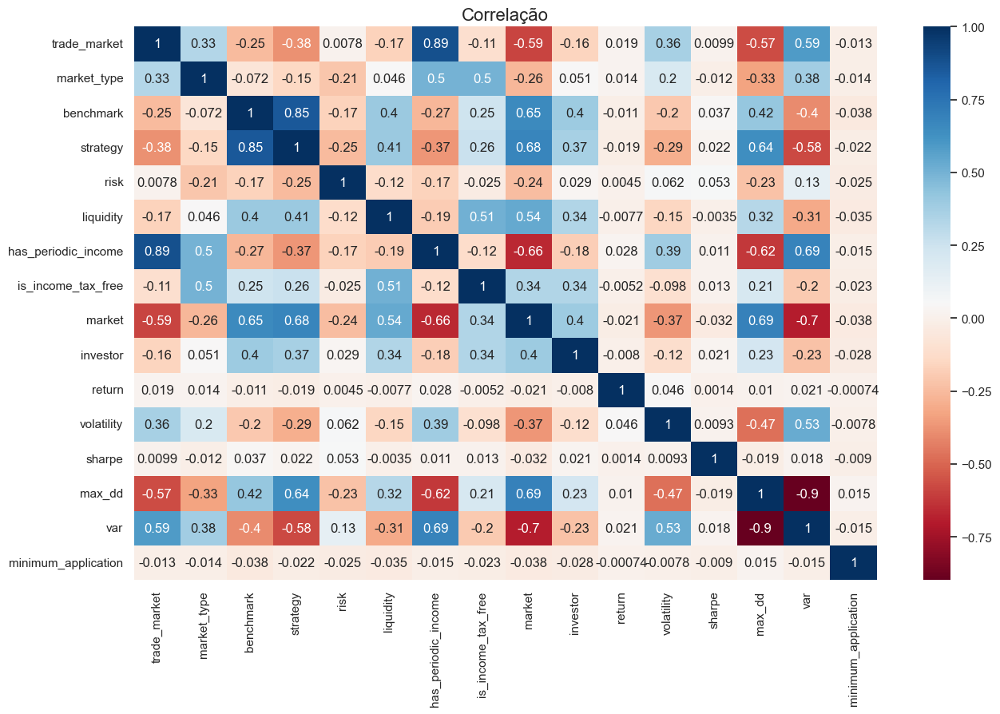

In [40]:
df.corr()
plt.figure(figsize=(15,9))
sns.heatmap(df.corr(),annot=True,cmap='RdBu')
plt.title('Correlação',fontsize=16)
plt.yticks(rotation =0)
plt.show()

In [41]:
df.to_csv('dataFinal.csv')

## Padronizando os dados
<hr style="border:2px solid #0077b9;">

In [42]:
#pip install sklearn

In [43]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df_std = scaler.fit_transform(df)
df_std = pd.DataFrame(data=df_std, columns=df.columns)
df_std.index=df.index
df_std.head()

,trade_market,market_type,benchmark,strategy,risk,liquidity,has_periodic_income,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application
0,5.306886,0.775252,-1.141092,-2.067439,1.082496,-0.716043,3.725264,-0.456574,-2.468116,-0.686018,-0.022084,1.458912,0.041461,-2.551052,3.167424,-0.054716
1,5.306886,0.775252,-1.141092,-2.067439,1.082496,-0.716043,3.725264,-0.456574,-2.468116,-0.686018,-0.073770,1.791751,0.041376,-4.979191,3.785130,-0.054738
2,5.306886,0.775252,-1.141092,-2.067439,1.082496,-0.716043,3.725264,-0.456574,-2.468116,-0.686018,-0.041038,0.677783,0.041371,-2.182118,1.421513,-0.054733
3,3.458626,0.775252,-1.141092,-2.067439,1.082496,-0.716043,3.725264,-0.456574,-2.468116,-0.686018,-0.015167,0.972649,0.041473,-0.601528,2.269534,-0.054733
4,5.306886,0.775252,-1.141092,-2.067439,1.082496,-0.716043,3.725264,-0.456574,-2.468116,-0.686018,-0.020659,1.669487,0.041466,-2.730271,3.172300,-0.054734


## Como definir a quantidade de grupos do K-Means?
<hr style="border:2px solid #0077b9;">

O número de grupos pode ser um chute. Mas existem formas de encontrar um valor k que seja próximo do ideal. Uma das técnicas mais utilizadas é a técnica do cotovelo.

A ideia é treinar vários modelos do K-means com valores diferentes de k. Depois, gerar um gráfico mostrando o valor de inércia (WCSS, Within Clusters Sum of Squares) do modelo pelo número de k grupos. 

Aqueles valores no "cotovelo" do gráfico são possivelmente os melhores valores de k.

In [44]:
# importar o K-means
from sklearn.cluster import KMeans

wcss = []
for i in range(1,11):
    # inserir chamada ao K-means
    kmeans = KMeans(n_clusters=i, random_state=42)
    # agrupar
    kmeans.fit(df)
    # salvar resultado
    wcss.append(kmeans.inertia_)

O trecho de código a seguir exibe o gráfico:

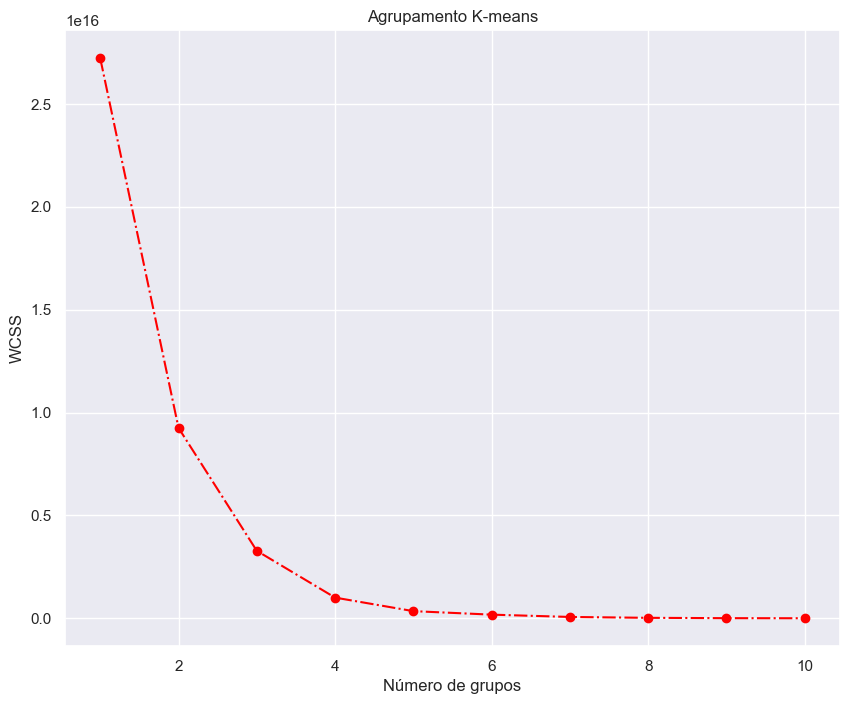

In [45]:
plt.figure(figsize = (10,8))
plt.plot(range(1, 11), wcss, marker = 'o', linestyle = '-.',color='red')
plt.xlabel('Número de grupos')
plt.ylabel('WCSS')
plt.title('Agrupamento K-means')
plt.show()

## Agrupando com K-means
<hr style="border:2px solid #0077b9;">

<b> K-Means Clustering </b>
É um método de clusterização baseado em centróides (K-means), em que cada elemento do cluster tem como base a sua distância média de um dos centros determinados no momento de instanciar o modelo. Por exemplo n_clusters=2. Este número k, definido de antemão, será calculado por uma série de tentativas aleatórias o que minimiza a distância entre pontos no conjunto de dados e cada centro de cluster. O problema é conhecido como NP-hard e, portanto, as soluções são comumente aproximadas ao longo de uma série de tentativas. Porém o output do K-means será sempre catogórico: pertence a determinado cluster ou não sem a possibilidade de ambiguidades ou probabilidades.

In [46]:
# Crie uma variável 'n_clusters' que vai servir de parâmetro do K-means
# Defina a chamada ao método
# Agrupe
n_cluster=3
kmeans = KMeans(n_clusters=n_cluster, random_state=42)
kmeans.fit(df_std)

KMeans(n_clusters=3, random_state=42)

## Determinando os segmentos
<hr style="border:2px solid #0077b9;">

Vamos associar cada rótulo de grupo gerado pelo K-means na etapa anterior ao seu registro equivalente:

In [47]:
df_segm_kmeans = df.copy()
df_segm_kmeans = pd.DataFrame(data = df, columns = df.columns)
df_segm_kmeans['Segmento K-means'] = kmeans.labels_ # Qual atributo do modelo me informa os rótulos?
df_segm_kmeans.head()

,trade_market,market_type,benchmark,strategy,risk,liquidity,has_periodic_income,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application,Segmento K-means
0,3,8,0,0,4.0,2,1,0,0,0,-0.012772,0.546089,-0.203219,-0.419996,0.075613,33.37,2
1,3,8,0,0,4.0,2,1,0,0,0,-0.601458,0.654105,-1.069647,-0.758763,0.088618,2.80,2
2,3,8,0,0,4.0,2,1,0,0,0,-0.228653,0.292589,-1.117116,-0.368523,0.038853,10.20,2
3,2,8,0,0,4.0,2,1,0,0,0,0.066005,0.388282,-0.082924,-0.148004,0.056708,9.21,2
4,3,8,0,0,4.0,2,1,0,0,0,0.003454,0.614427,-0.154208,-0.445000,0.075715,8.75,2


Agora que temos os rótulos de grupo de cada registros, podemos analisar esses registros por grupo considerando como métrica a  <b> média. </b>

In [48]:
df_segm_analise = df_segm_kmeans.groupby(['Segmento K-means'])
investimentos = df_segm_analise.size()
df_segm_analise = df_segm_analise.mean() # Inserir a métrica necessária = média
df_segm_analise['investimentos'] = investimentos
df_segm_analise.head()

,trade_market,market_type,benchmark,strategy,risk,liquidity,has_periodic_income,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application,investimentos
Segmento K-means,,,,,,,,,,,,,,,,,
0,0.000000,3.971754,24.758503,7.213990,2.526398,1218.886276,0.00000,0.356403,1.999556,0.581633,0.124378,0.001783,-57.909804,-0.000104,-0.000257,7200.000552,6762
1,0.000000,1.822461,4.028152,3.571061,3.110943,231.927198,0.00000,0.009687,1.270471,0.138035,0.183487,0.076504,-855.487416,-0.081177,0.010225,156272.424938,6607
2,1.897225,13.902364,1.746146,1.748201,2.059096,2.032888,0.99075,0.000000,0.009250,0.004111,1.408934,0.538664,0.441328,-0.392602,0.063882,320.370832,973


Podemos gerar um gráfico para analisar os valores de cada atributo por grupo:

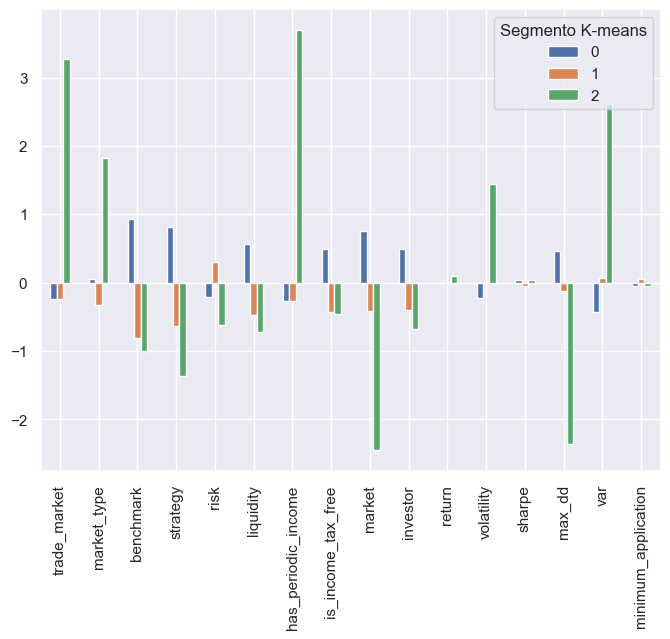

In [49]:
fig, ax = plt.subplots(figsize=(8,6))
df_segm_kmeans_std = df_std.copy()
df_segm_kmeans_std = pd.DataFrame(data = df_std, columns = df_std.columns)
df_segm_kmeans_std['Segmento K-means'] = kmeans.labels_ # Atributo do modelo que informa os grupos
df_segm_kmeans_std.groupby(['Segmento K-means']).mean().T.plot.bar(ax=ax) # Métrica de análise dos grupos
plt.show()

Podemos então definir os grupos considerando essas informações. Analise as informações que tem e tente dar nome a cada um dos grupos gerados:

In [50]:
df_segm_analise.rename({0:'1-INVESTMENT BROKER - 2-LC/FUNDOS - 3-SP500/IGPM - 4-INFLAÇAO - 5-RISCO MÉDIO - 6- L:BAIXA_1218 DIAS - 7-SEM PERIODICIDADE NO REND. - 8- SEM IR - 9- RENDA FIXA/FUNDO INVESTIMENTO - 10-PUBLICO GERAL/QUALIFICADO - 11-R:0.12_BAIXO - 12-V:0_BAIXA - 13-S:57.9_MEDIO - 14- SEM PERDAS - 15-VALOR INICIAL MÉDIO',
                        1:'1-INVESTMENT BROKER - 2-FUNDO MULTIMERCADO E DE RENDA FIXA- 3-OUTRO - 4-POS-FIXADO/OUTRO -5-RISCO ALTO -6-L:MEDIA_231 DIAS - 7-SEM PERIODICIDADE NO REND. 8- SEM IR - 9- FUNDO DE INVESTIMENTO - 10-PUBICO GERAL - 11-R:0.18´BAIXO - 12-V:0_BAIXA - 13-S:855.5_ALTO - 14-APENAS PERDA MINIMA 15- VALOR INICIAL ALTO', 
                        2:'1-BOLSA/BDR/CDA - 2-ATIVO REAL/CCB- 3-BDRX/IFIX - 4-INTERNACIONAL/ALTERNATIVO- 5-RISCO BAIXO 6-L:ALTA_2DIAS - 7- COM PERIODICIDADE NO REND. 8- SEM IR - 9-RENDA VARIAVEL - 10-PUBICO GERAL - 11-R:1.4-ALTO - 12-V:0.5_BAIXA - 13-S:0.4_BAIXO - 14-PERDA MAX 0,39 - 15-VALOR INICIAL BAIXO'
                       }) # Adicione quantos forem necessários

,trade_market,market_type,benchmark,strategy,risk,liquidity,has_periodic_income,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application,investimentos
Segmento K-means,,,,,,,,,,,,,,,,,
1-INVESTMENT BROKER - 2-LC/FUNDOS - 3-SP500/IGPM - 4-INFLAÇAO - 5-RISCO MÉDIO - 6- L:BAIXA_1218 DIAS - 7-SEM PERIODICIDADE NO REND. - 8- SEM IR - 9- RENDA FIXA/FUNDO INVESTIMENTO - 10-PUBLICO GERAL/QUALIFICADO - 11-R:0.12_BAIXO - 12-V:0_BAIXA - 13-S:57.9_MEDIO - 14- SEM PERDAS - 15-VALOR INICIAL MÉDIO,0.000000,3.971754,24.758503,7.213990,2.526398,1218.886276,0.00000,0.356403,1.999556,0.581633,0.124378,0.001783,-57.909804,-0.000104,-0.000257,7200.000552,6762
1-INVESTMENT BROKER - 2-FUNDO MULTIMERCADO E DE RENDA FIXA- 3-OUTRO - 4-POS-FIXADO/OUTRO -5-RISCO ALTO -6-L:MEDIA_231 DIAS - 7-SEM PERIODICIDADE NO REND. 8- SEM IR - 9- FUNDO DE INVESTIMENTO - 10-PUBICO GERAL - 11-R:0.18´BAIXO - 12-V:0_BAIXA - 13-S:855.5_ALTO - 14-APENAS PERDA MINIMA 15- VALOR INICIAL ALTO,0.000000,1.822461,4.028152,3.571061,3.110943,231.927198,0.00000,0.009687,1.270471,0.138035,0.183487,0.076504,-855.487416,-0.081177,0.010225,156272.424938,6607
"1-BOLSA/BDR/CDA - 2-ATIVO REAL/CCB- 3-BDRX/IFIX - 4-INTERNACIONAL/ALTERNATIVO- 5-RISCO BAIXO 6-L:ALTA_2DIAS - 7- COM PERIODICIDADE NO REND. 8- SEM IR - 9-RENDA VARIAVEL - 10-PUBICO GERAL - 11-R:1.4-ALTO - 12-V:0.5_BAIXA - 13-S:0.4_BAIXO - 14-PERDA MAX 0,39 - 15-VALOR INICIAL BAIXO",1.897225,13.902364,1.746146,1.748201,2.059096,2.032888,0.99075,0.000000,0.009250,0.004111,1.408934,0.538664,0.441328,-0.392602,0.063882,320.370832,973


In [51]:
df_segm_kmeans['Grupo'] = df_segm_kmeans['Segmento K-means'].map( {0:'RF e Fundo de inflaçao: Com BAIXA liquidez, volatilidade, rendimento e perda, mas com risco, sharpe e investimento inicial MÉDIO e sem rendimentos periodicos',
                                                                   1:'RF e Fundo pos-fixado: Com BAIXA volatilidade, rendimento e perda, com liquidez MÉDIA e com o risco, sharpe e investimento inicial ALTO  e sem rendimentos periodicos', 
                                                                   2:'RV e internacional: Com BAIXO Risco, volatilidade sharpe e investimento inicial, Com alta liquidez, rendimento, aceita perda e tem rendimentos periodicos'}) # Mapeamento que você definiu acima
df_segm_kmeans.head()

,trade_market,market_type,benchmark,strategy,risk,liquidity,has_periodic_income,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application,Segmento K-means,Grupo
0,3,8,0,0,4.0,2,1,0,0,0,-0.012772,0.546089,-0.203219,-0.419996,0.075613,33.37,2,"RV e internacional: Com BAIXO Risco, volatilid..."
1,3,8,0,0,4.0,2,1,0,0,0,-0.601458,0.654105,-1.069647,-0.758763,0.088618,2.80,2,"RV e internacional: Com BAIXO Risco, volatilid..."
2,3,8,0,0,4.0,2,1,0,0,0,-0.228653,0.292589,-1.117116,-0.368523,0.038853,10.20,2,"RV e internacional: Com BAIXO Risco, volatilid..."
3,2,8,0,0,4.0,2,1,0,0,0,0.066005,0.388282,-0.082924,-0.148004,0.056708,9.21,2,"RV e internacional: Com BAIXO Risco, volatilid..."
4,3,8,0,0,4.0,2,1,0,0,0,0.003454,0.614427,-0.154208,-0.445000,0.075715,8.75,2,"RV e internacional: Com BAIXO Risco, volatilid..."


## Visualizando grupos com PCA
<hr style="border:2px solid #0077b9;">

Nosso conjunto de dados tem muitas dimensões, sendo assim, não é fácil enxergar os grupos em um espaço tridimensional. Podemos adotar uma estratégia chamada Análise de Componentes Principais ou PCA (Principal Component Analysis).

É uma técnica de análise multivariada que pode ser usada para analisar inter-relações entre um grande número de variáveis e explicar essas variáveis em termos de suas dimensões inerentes (Componentes).

O objetivo é encontrar um meio de condensar a informação contida em várias variáveis originais em um conjunto menor de variáveis estatísticas (componentes) com uma perda mínima de informação.

O número de componentes principais se torna o número de variáveis consideradas na análise, mas geralmente as primeiras componentes são as mais importantes já que explicam a maior parte da variação total.

As componentes principais em geral são extraídas via matriz de covariância, mas também podem ser extraídas via matriz de correlação.

In [52]:
# Consulte a scikit para entender como implementar a PCA
# Crie uma PCA de 3 componentes

from sklearn.decomposition import PCA
pca = PCA(n_components=3)
pca.fit(df_std)

# Exiba os valores das componentes
print(pca.explained_variance_ratio_)


[0.34892303 0.13347451 0.07559474]


Agora, vamos criar um DataFrame que armazena a tranformação de cada um dos resgitros do conjunto reduzidos às 3 componentes:

In [53]:
grupos_3d = pca.transform(df_std) # Método de transformação da PCA
grupos_3d.shape
grupos_df_3d = pd.DataFrame(grupos_3d).loc[:,:2]
grupos_df_3d.columns = ['PC1','PC2','PC3']
grupos_df_3d.head()

,PC1,PC2,PC3
0,7.890632,2.179684,0.090752
1,9.043114,2.582704,-0.401428
2,6.967948,1.754046,0.365838
3,6.227803,1.277991,0.236310
4,8.001755,2.230143,0.044837


O trecho de código abaixo garante que estamos usando a versão mais recente da biblioteca plotly:

In [54]:
#!pip uninstall -q -y plotly
#!pip install -q plotly

Essa função serve para plotar um gráfico em 3 dimensões com as observações (registros) e seus respectivos grupos:

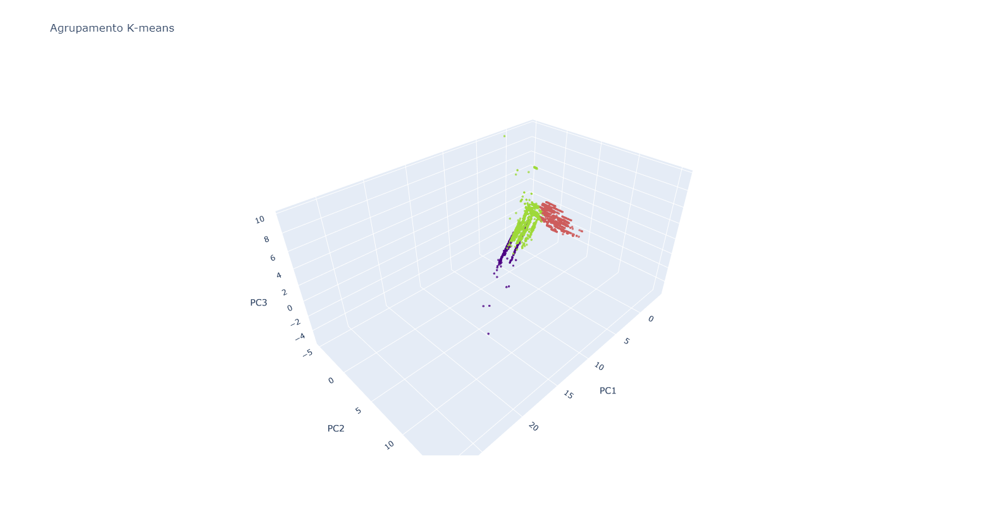

In [55]:
def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>  '''))
  init_notebook_mode(connected=False)
  
  
from plotly.offline import init_notebook_mode
enable_plotly_in_cell()
init_notebook_mode(connected=False)

import plotly.offline as py
import plotly.graph_objs as go

trace1 = go.Scatter3d(
    x=grupos_df_3d["PC1"],
    y=grupos_df_3d["PC2"],
    z=grupos_df_3d["PC3"],
    mode='markers',
    text= kmeans.labels_,
    marker=dict(
        size=2,
        color= kmeans.labels_,         
        colorscale=[[0.0,"indianred"],[0.2,"darkorange"],[0.4,"yellow"],[0.6,"mediumseagreen"],[0.8,"skyblue"],[1.0, "indigo"]],
        opacity=0.8
    )
)

data = [trace1]
layout = go.Layout(
    showlegend=False,
    title="Agrupamento K-means",
    scene = dict(
        xaxis = dict(title="PC1"),
        yaxis = dict(title="PC2"),
        zaxis = dict(title="PC3")
    ),
    width=800,
    height=800
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='3d-scatter-colorscale')

## Analisando os grupos com a métrica de silhueta
<hr style="border:2px solid #0077b9;">

A métrica de silhueta se refere a um método de interpretação e validação de consistência dentro de grupos. O valor da silhueta é uma medida de quão semelhante um objeto é ao seu próprio cluster (coesão) em comparação com outros clusters (separação). Ele pode ser usado para estudar a distância de separação entre os clusters resultantes. O gráfico de silhueta exibe uma medida de quão próximo cada ponto em um cluster está de pontos nos clusters vizinhos e, portanto, fornece uma maneira de avaliar parâmetros como o número de clusters visualmente.

In [56]:
#pip install yellowbrick

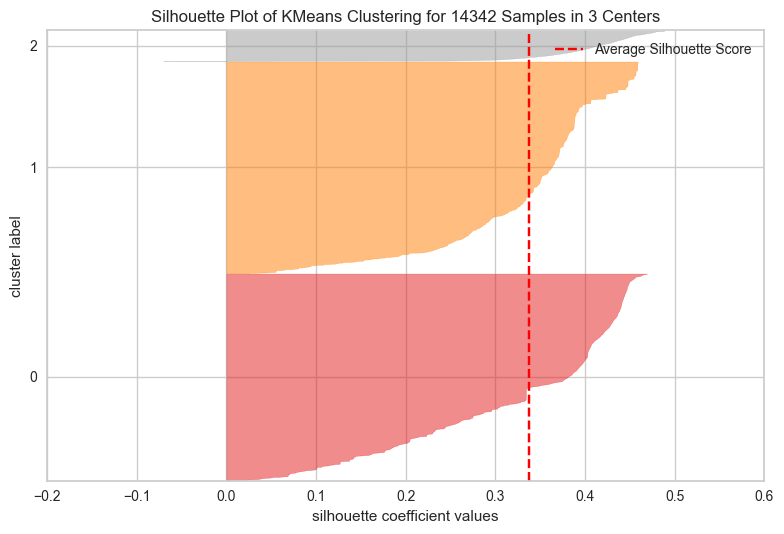

In [57]:
# Vamos utilizar o método que está disponível na biblioteca yellowbrick
# chamado SilhouetteVisualizer
from sklearn.cluster import KMeans
from yellowbrick.cluster import SilhouetteVisualizer

n_clusters = 3 # Número de grupos que escolhemos
sil = SilhouetteVisualizer(KMeans(n_clusters)) # Método SilhouetteVisualizer
sil.fit(df_std)
sil.finalize()
plt.tight_layout()
plt.show()

## Agrupamento Hierárquico
<hr style="border:2px solid #0077b9;">

Uma função para nos ajudar a plotar o dendograma:

In [58]:
from scipy.cluster.hierarchy import dendrogram

def plot_dendrogram(model, **kwargs):
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    dendrogram(linkage_matrix, **kwargs)

Utilizando o agrupamento acumulativo da scikit:

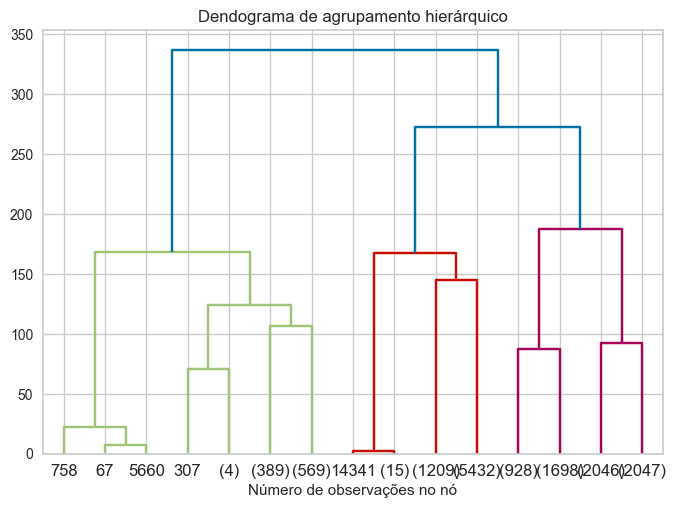

In [59]:
# Consultar a scikit para encontrar o método de agrupamento acumulativo
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering

dend = AgglomerativeClustering(distance_threshold=0, n_clusters= None) # Chamada do método
dend = dend.fit(df_std)
plt.title("Dendograma de agrupamento hierárquico")
plot_dendrogram(dend, truncate_mode="level", p=3)
plt.xlabel("Número de observações no nó")
plt.show()

----------------------------------------- fim--------------------------

errado


<b> O Mean-Shift Clustering ou agrupamento de deslocamento médio </b>  é um algoritmo baseado em foco deslizante que tenta encontrar áreas densas nos data points. Também é um algoritmo baseado em centróides, o que significa que o objetivo é localizar os pontos centrais de cada grupo / classe. Para fazer isso, ele fica atualizando candidatos a pontos centrais a serem a média dos pontos dentro da desse foco ou janela deslizante. Essas janelas candidatas são filtradas em um estágio de pós-processamento para eliminar as similares, formando o conjunto final de pontos centrais e seus grupos correspondentes. 

Ele visa descobrir "bolhas" em uma densidade suave de Amostras. É um algoritmo baseado em centroid, que funciona atualizando candidatos para centroids para ser a média dos pontos dentro de um dado região. Esses candidatos são então filtrados em uma etapa pós-processamento para eliminar quase duplicatas para formar o conjunto final de centroids. A semeadura é realizada utilizando uma técnica de binning para escalabilidade.

Em contraste com o K-means, não há necessidade de selecionar o número de clusters, pois o Means-Shift descobre isso automaticamente. Essa é uma de suas maiores vantagens. O fato de os centros do cluster convergirem para os pontos de densidade máxima também é bastante desejável, pois é bastante intuitivo e se encaixa bem, no sentido data-driven. Sua maior desvantagem é que definir seleção do tamanho/raio da janela, escolher este valor pode não ser trivial.

<b> Mean-Shift Clustering pela perspectiva de uma única janela </b>

In [60]:
from sklearn.cluster import MeanShift
from numpy import unique
from numpy import where

modelMS = MeanShift()

# fit model and predict clusters
MS = modelMS.fit_predict(df_std)

# retrieve unique clusters
clusters = unique(MS)

# create scatter plot for samples from each cluster
for cluster in clusters:
    # get row indexes for samples with this cluster
    row_ix = where(MS == cluster)
    # create scatter of these samples
    plt.scatter(df_std[row_ix, 0], df_std[row_ix, 1])

# show the plot
plt.show()

InvalidIndexError: ((array([  964,   965,   966, ..., 14318, 14319, 14320], dtype=int64),), 0)

<b> Clusterização baseada em densidade </b>

<code> DBSCAN — Density-Based Spatial Clustering of Applications with Noise </code> </br>
O DBSCAN, um algoritmo de agrupamento baseado em densidade, é uma melhoria em relação ao agrupamento Mean-Shift. 

In [ ]:
from sklearn.cluster import DBSCAN
fig= plt.figure(figsize=(10,7))

modelDB = DBSCAN(eps=0.6, min_samples=100)

# fit model and predict clusters
dbscan = modelDB.fit_predict(df_std)

# retrieve unique clusters
clusters = unique(dbscan)

# create scatter plot for samples from each cluster
for cluster in clusters:
    # get row indexes for samples with this cluster
    row_ix = where(dbscan == cluster)
    # create scatter of these samples
    pyplot.scatter(df_std[row_ix, 0], df_std[row_ix, 1])

# show the plot
pyplot.show()

<b> Clusterização baseada em distribuição </b> </br></br>
<code> Expectation–Maximization (EM) Clustering using Gaussian Mixture Models (GMM) </code> </br> </br>
Uma das principais desvantagens do K-Means é seu uso ingênuo ou simplista do K-Means para determinar o centro do cluster. O K-Means não pode lidar com isso porque os valores médios dos clusters estão muito próximos. Sem falar que o K-Means também falha nos casos em que os clusters não são circulares, novamente porque usa como resultado do a média como centro do cluster. </br>

<b> Modelos de Mistura Gaussiana (GMMs) </b> nos dão mais flexibilidade do que K-Means. Com GMMs, assumimos que os pontos de dados têm distribuição Gaussiana; esta é uma suposição menos restritiva do que dizer que eles são circulares usando a média. Dessa forma, temos dois parâmetros para descrever a forma dos clusters: a média e o desvio padrão! Tomando um exemplo em duas dimensões, isso significa que os clusters podem assumir qualquer tipo de forma elíptica (uma vez que temos um desvio padrão nas direções x e y). Assim, cada distribuição gaussiana é atribuída a um único cluster. </br>

Para encontrar os parâmetros do Gaussiano para cada cluster (por exemplo, a média e o desvio padrão), usaremos um algoritmo de otimização chamado Expectation — Maximization (EM).

In [ ]:
from sklearn.mixture import GaussianMixture
fig= plt.figure(figsize=(10,7))

# define the model
modelGM = GaussianMixture(n_components=3, random_state=42)

# assign a cluster to each example
gm = modelGM.fit_predict(df_std)

# retrieve unique clusters
clusters = unique(gm)

# create scatter plot for samples from each cluster
for cluster in clusters:
    # get row indexes for samples with this cluster
    row_ix = where(gm == cluster)
    # create scatter of these samples
    pyplot.scatter(df_std[row_ix, 0], df_std[row_ix, 1])

    # show the plot
pyplot.show()

<b> Clusterização por conectividade </b></br>
Agglomerative Hierarchical Clustering </br>
Os algoritmos de Hierarchical Clustering ou agrupamento hierárquico se enquadram em 2 categorias: top-down ou bottom-up. Algoritmos bottom-up ou ascendentes tratam cada ponto de dados como um único cluster no início e então mesclam (ou aglomeram) pares de clusters sucessivamente até que todos os clusters tenham sido mesclados em um único cluster que contém todos os pontos de dados. O agrupamento hierárquico bottom-up é, portanto, denominado agrupamento aglomerativo hierárquico ou HAC. Esta hierarquia de clusters é representada como uma árvore (ou dendrograma). A raiz da árvore é o único cluster que reúne todas as amostras, sendo as folhas os aglomerados com apenas uma amostra. </br>
O clustering hierárquico não exige que especifiquemos o número de clusters e podemos até selecionar qual número de clusters parece melhor, já que estamos construindo uma árvore. Além disso, o algoritmo não é sensível à escolha da métrica de distância; todos eles tendem a funcionar igualmente bem, enquanto com outros algoritmos de agrupamento, a escolha da métrica de distância é crítica. Um caso de uso particularmente bom de métodos de agrupamento hierárquico é quando os dados subjacentes têm uma estrutura hierárquica e você deseja recuperar a hierarquia; outros algoritmos de agrupamento não podem fazer isso. Essas vantagens do agrupamento hierárquico vêm ao custo de menor eficiência, pois tem uma complexidade de tempo de O (n³), ao contrário da complexidade linear de K-Means e GMM.

In [ ]:
from sklearn.cluster import AgglomerativeClustering
fig= plt.figure(figsize=(10,7))

modelAG = AgglomerativeClustering(n_clusters=3)

# fit model and predict clusters
agg = modelAG.fit_predict(df_std)

# retrieve unique clusters
clusters = unique(agg)

# create scatter plot for samples from each cluster
for cluster in clusters:
    # get row indexes for samples with this cluster
    row_ix = where(agg == cluster)
    # create scatter of these samples
    pyplot.scatter(df_std[row_ix, 0], df_std[row_ix, 1])

# show the plot
pyplot.show()